# Basics 

In this notebook we will cover the basic analysis workflow using Seurat

## Settings

First, we will load all the libraries we need and the data that was generated on the previous section

In [2]:
library(dplyr)
library(Seurat)
library(patchwork)
library(loomR)

set.seed(7)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Attaching SeuratObject

Loading required package: R6

Loading required package: hdf5r


Attaching package: ‘loomR’


The following object is masked from ‘package:dplyr’:

    combine




# Preprocessing

## Seurat object

Let's create a Seurat object and take a look at what's inside

In [4]:
# Load the Neurons5k dataset
nr5k.data <- Read10X(data.dir = "../data/matrices/neurons5k",unique.features = T,strip.suffix = T)

In [5]:
nr5k <- CreateSeuratObject(counts = nr5k.data, project = "nr5k", min.cells = 3, min.features = 200)
nr5k

An object of class Seurat 
18220 features across 5354 samples within 1 assay 
Active assay: RNA (18220 features, 0 variable features)

In [6]:
# Data
nr5k.data[1:5,1:10]

   [[ suppressing 10 column names ‘AAACCCACAAGAAATC’, ‘AAACCCACAGTAGATA’, ‘AAACCCACATCGATGT’ ... ]]



5 x 10 sparse Matrix of class "dgCMatrix"
                           
Xkr4    . . 1 . . . . . . .
Gm1992  . . . . . . . . . .
Gm19938 . . . . . . . . . 1
Gm37381 . . . . . . . . . .
Rp1     . . . . . . . . . .

In [7]:
# Genes
rownames(nr5k)[1:10]

[1] "Xkr4"    "Gm19938" "Rp1"     "Sox17"   "Mrpl15"  "Lypla1"  "Tcea1"  
 [8] "Rgs20"   "Atp6v1h" "Rb1cc1"

In [8]:
# Cells
colnames(nr5k)[1:5]

[1] "AAACCCACAAGAAATC" "AAACCCACAGTAGATA" "AAACCCACATCGATGT" "AAACCCATCCGTATGA"
[5] "AAACCCATCGGAGCAA"

In [9]:
# Cell labels
nr5k$orig.ident[1:5]

AAACCCACAAGAAATC AAACCCACAGTAGATA AAACCCACATCGATGT AAACCCATCCGTATGA 
            nr5k             nr5k             nr5k             nr5k 
AAACCCATCGGAGCAA 
            nr5k 
Levels: nr5k

In [13]:
# Active data matrix
nr5k@active.assay

[1] "RNA"

## Data QCs

We will look at come of the most commonly used quality control metrics such as the proportion of mitochondrial genes and the number of features found in each cell. We will used these values to filter out low quality cells. 

In [14]:
nr5k[["percent.mt"]] <- PercentageFeatureSet(nr5k, pattern = "^mt-")
head(nr5k@meta.data, 5)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt
,<fct>,<dbl>,<int>,<dbl>
AAACCCACAAGAAATC,nr5k,14178,4206,5.219354
AAACCCACAGTAGATA,nr5k,10438,3834,6.380533
AAACCCACATCGATGT,nr5k,13329,4222,3.083502
AAACCCATCCGTATGA,nr5k,6358,2926,7.518087
AAACCCATCGGAGCAA,nr5k,580,393,0.000000


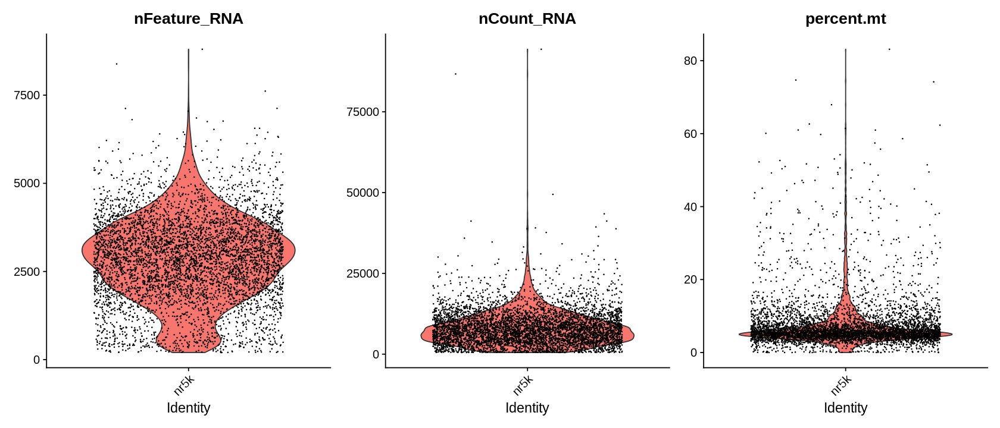

In [15]:
options(repr.plot.width=14, repr.plot.height=6)
VlnPlot(nr5k, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3) 

In [16]:
nr5k <- subset(nr5k, subset = nFeature_RNA > 200 & nFeature_RNA < 7000 & percent.mt < 20 & nCount_RNA<25000)
nr5k

An object of class Seurat 
18220 features across 5036 samples within 1 assay 
Active assay: RNA (18220 features, 0 variable features)

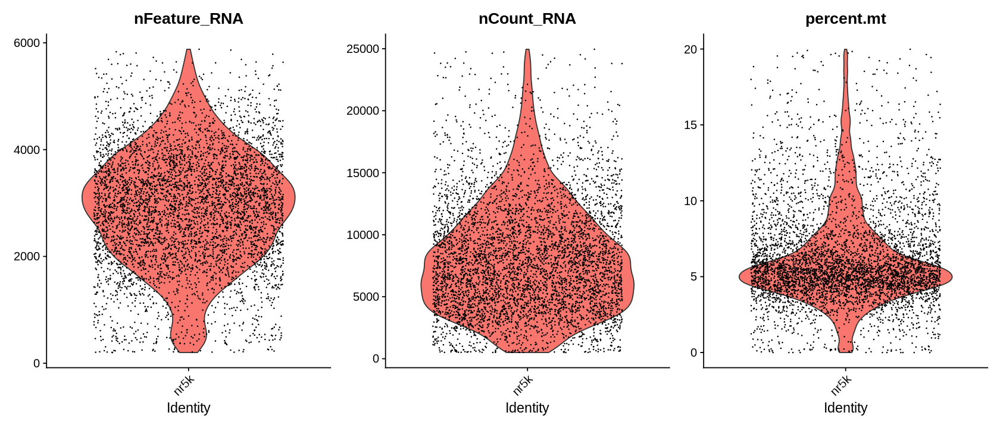

In [17]:
options(repr.plot.width=14, repr.plot.height=6)
VlnPlot(nr5k, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

## Normalization

We will use Seurat's SCTransform function, which replaces the previous steps (NormalizeData, ScaleData, and FindVariableFeatures). The transformed data is stored as a new assay called `SCT`by default and will remain as default assay unless it is explicitly changed. The function also allows you to remove unwanted sources of variation such as the percentage of mitochondrial genes. 

In [18]:
nr5k <- SCTransform(nr5k, vars.to.regress = "percent.mt", verbose = FALSE,variable.features.n = 2000)

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

In [19]:
nr5k@active.assay

[1] "SCT"

# Analisis 

The standard analysis workflow for visualization involves applying dimensionality reduction and clustering. 

## Dimensionality reduction and clustering

This is one of the standar methods used for visualization used to visualize single cell data. The funcitons from single cell analysis packages have default values that are often optimized based on empirical observations. Sometimes these values might nont be the best for your specific dataset, and can have a huge impact on your visualizations. In the next sections we will look at the effect of some of the most important parametets for each method. 

### PCA

Here we should pay attention to two things:

1. The variables - discard features that will not help us distinguish between cells (low expression, constant expression)
2. That data - it needs to be normalized and scaled

The function `SCTransform` already takes care of those two things, we just need to specify the set of variable features in the PCA function call. 

In [20]:
nr5k <- RunPCA(nr5k, verbose = FALSE,features = VariableFeatures(nr5k)) 

In [21]:
head(Embeddings(nr5k, reduction = "pca")[, 1:5])

,PC_1,PC_2,PC_3,PC_4,PC_5
AAACCCACAAGAAATC,2.970469,1.508613,14.059655,8.3641380,-21.441553
AAACCCACAGTAGATA,-0.260772,-7.130417,-6.325190,1.1501411,-9.755083
AAACCCACATCGATGT,-18.545744,1.577200,5.220545,-4.7556902,19.062164
AAACCCATCCGTATGA,47.057967,8.666804,-6.855222,-0.9096497,2.342593
AAACCCATCGGAGCAA,4.845325,-6.331862,8.333753,-9.5070092,-2.191126
AAACCCATCTTTCCAA,2.807524,1.309745,12.883150,9.6073004,-17.264205


In [22]:
head(Loadings(nr5k, reduction = "pca")[, 1:5])

,PC_1,PC_2,PC_3,PC_4,PC_5
Fabp7,0.144638656,0.002570578,0.0644323334,-0.1229992815,-0.015749818
Meg3,-0.043967921,-0.073823003,-0.2455543591,-0.0833405654,-0.024260952
Dbi,0.165483555,-0.002240938,0.0828733864,-0.1231141151,-0.057059350
Hbb-bs,-0.003762895,-0.004888382,-0.0011344965,-0.0003895172,-0.012662145
Hba-a1,-0.004287519,-0.002887640,-0.0009046468,0.0008298049,-0.009856054
Hba-a2,-0.004615876,-0.003440669,-0.0003044214,0.0020930238,-0.009445007


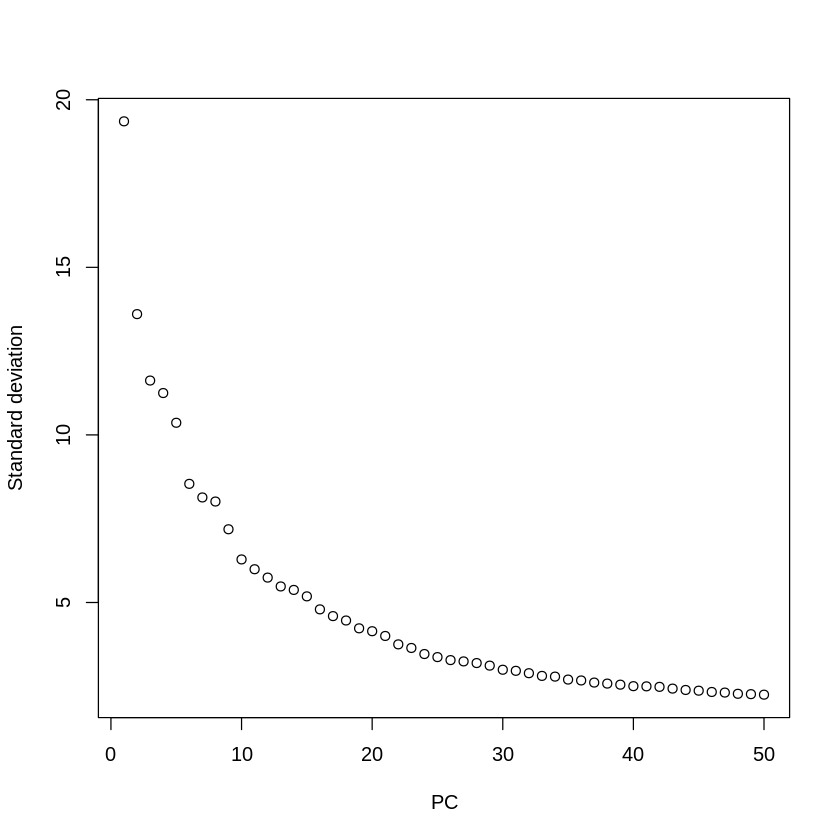

In [23]:
options(repr.plot.width=7, repr.plot.height=7)
sds<-Stdev(nr5k, reduction = "pca")
plot(1:length(sds),sds,xlab="PC",ylab="Standard deviation")

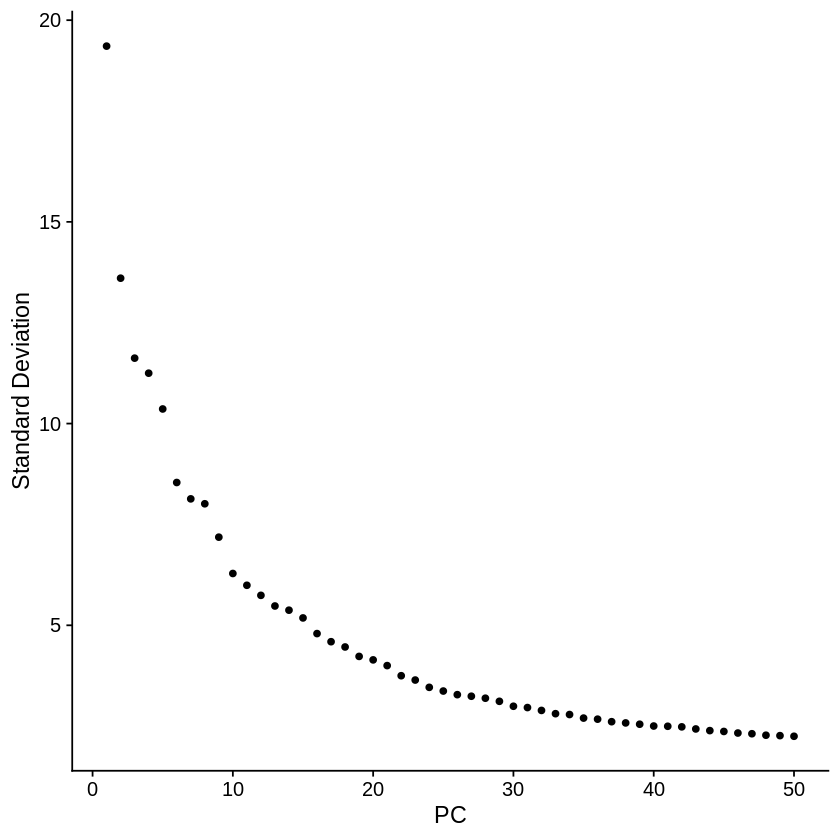

In [24]:
options(repr.plot.width=7, repr.plot.height=7)
ElbowPlot(nr5k,ndims = 50)

### Clusters

In [25]:
nr5k <- FindNeighbors(nr5k, dims = 1:20, verbose = FALSE) 
nr5k <- FindClusters(nr5k, resolution = 0.6,verbose = FALSE)

**Number of cells per cluster**

In [26]:
nr5k@active.ident %>% 
    table()

.
  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17 
899 883 376 368 355 316 314 301 300 280 251 143  68  48  41  37  30  26 

### UMAP

Two parameters that can help us improve the visualization are `spread` and `mean_dist`. These two values control how tighly UMAP can pack points in the embedding. If you want to dig deeper, this [git](https://jlmelville.github.io/uwot/abparams.html) has extensive examples of how to fine tune UMAP parameters. You can rad more about other parameter in the [documentation of UMAP](https://umap-learn.readthedocs.io/en/latest/parameters.html).

In [27]:
nr5k <- RunUMAP(nr5k, dims = 1:30, verbose = FALSE,reduction.key = 'umapdefault_')
nr5k@reductions[['umap.default']]<-nr5k@reductions$umap

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


In [28]:
nr5k <- RunUMAP(nr5k, dims = 1:30, verbose = FALSE,spread = 1,min.dist = 1)

In [29]:
nr5k

An object of class Seurat 
35232 features across 5036 samples within 2 assays 
Active assay: SCT (17012 features, 2000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, umap.default

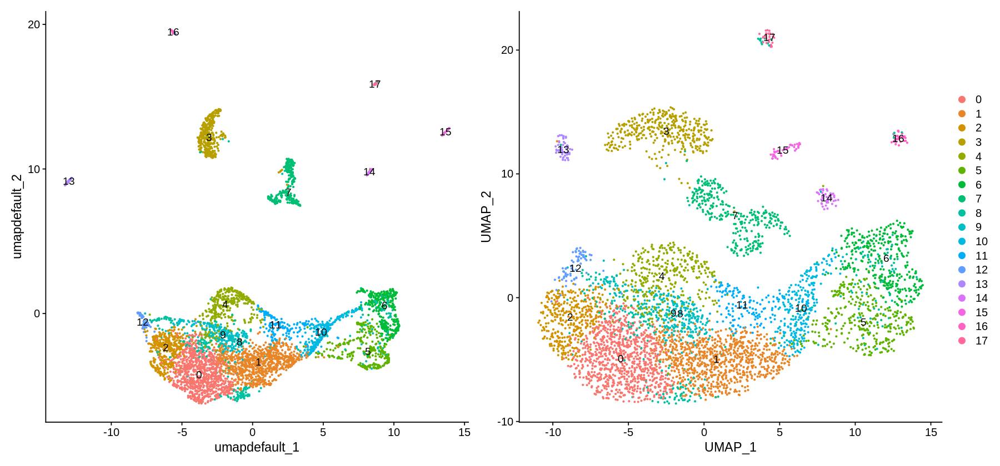

In [30]:
options(repr.plot.width=15, repr.plot.height=7)
DimPlot(nr5k, label = TRUE,pt.size = 0.5,reduction = 'umap.default')+NoLegend()+
DimPlot(nr5k, label = TRUE,pt.size = 0.5,reduction = 'umap')+NoLegend()

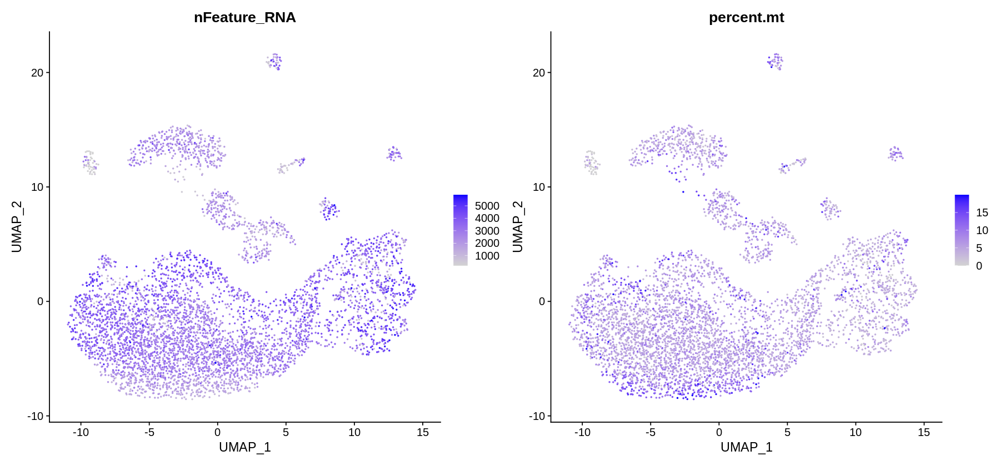

In [31]:
FeaturePlot(nr5k,features = c("nFeature_RNA"),reduction='umap')+
FeaturePlot(nr5k,features = c("percent.mt"),reduction='umap') +
plot_layout(ncol = 2)

## Cluster markers

In [51]:
markers <- FindAllMarkers(nr5k, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 1) %>% 
                group_by(cluster) %>% 
                top_n(n = 10, wt = avg_log2FC) 

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
“No features pass logfc.threshold threshold; returning empty data.frame”
Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17



In [52]:
genes <- markers %>% 
        group_by(cluster) %>% 
        top_n(n = 1, wt = avg_log2FC) %>% 
        .$gene

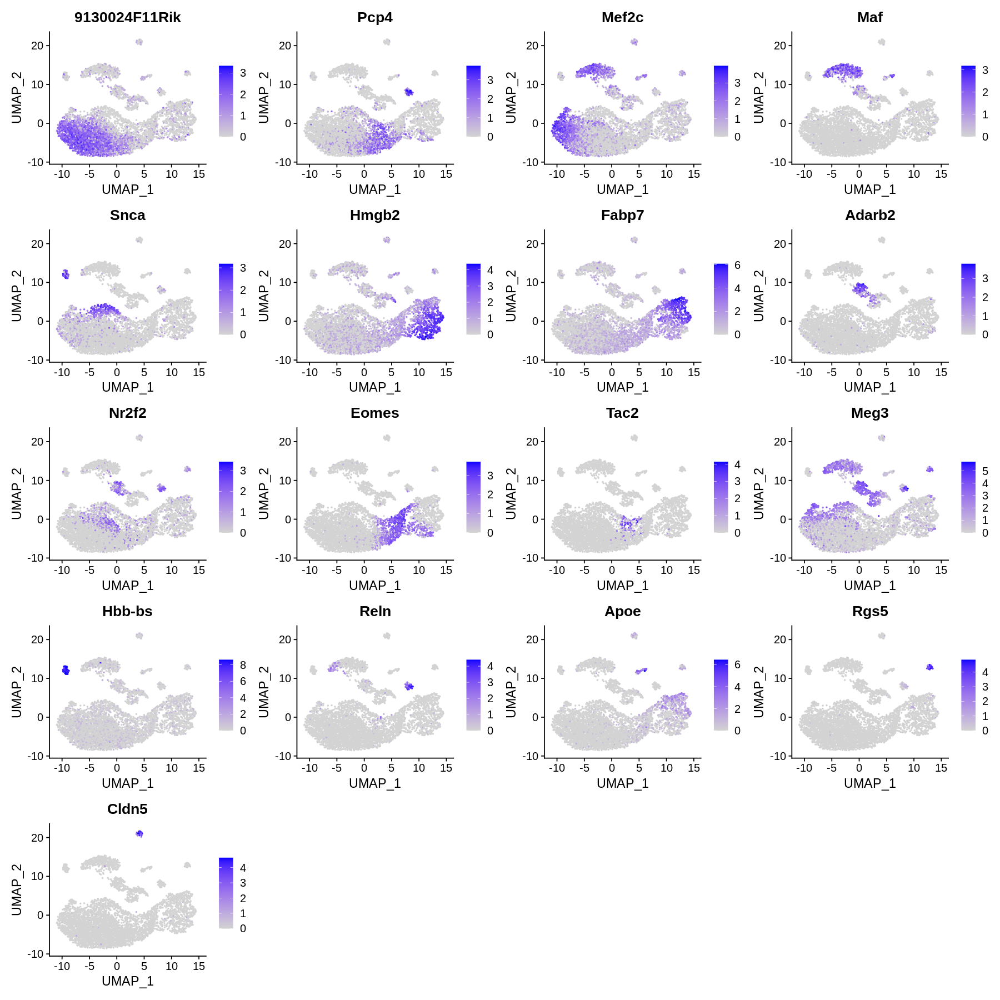

In [53]:
options(repr.plot.width=15, repr.plot.height=15)
FeaturePlot(nr5k, features = genes)

In [263]:
options(repr.plot.width=8, repr.plot.height=12)
plot <- FeaturePlot(nr5k, features = genes[1],ncol = 1)
HoverLocator(plot = plot, information = FetchData(nr5k, vars = c("ident", "PC_1", "nFeature_RNA")))

Warning message in if (is.na(col)) {:
"the condition has length > 1 and only the first element will be used"
Warning message in if (is.na(col)) {:
"the condition has length > 1 and only the first element will be used"
Warning message:
"`error_y.color` does not currently support multiple values."
Warning message:
"`error_x.color` does not currently support multiple values."
Warning message:
"`line.color` does not currently support multiple values."
Warning message:
"The titlefont attribute is deprecated. Use title = list(font = ...) instead."
Warning message in if (is.na(col)) {:
"the condition has length > 1 and only the first element will be used"
Warning message in if (is.na(col)) {:
"the condition has length > 1 and only the first element will be used"
Warning message:
"`error_y.color` does not currently support multiple values."
Warning message:
"`error_x.color` does not currently support multiple values."
Warning message:
"`line.color` does not currently support multiple values."


HTML widgets cannot be represented in plain text (need html)

# Cell type annotation

## Load reference 

We will use the reference annotations from [The Mouse Brain Atlas](http://mousebrain.org/downloads.html)

In [44]:
lref <- connect(filename = "../data/loom/a2.dev_all.agg.loom", mode = "r",skip.validate = TRUE)
lref

Warning message in initialize(...):
“Skipping validation step, some fields are not populated”


Class: loom
Filename: /home/jovyan/data/loom/dev_all.agg.loom
Access type: H5F_ACC_RDONLY
Attributes: last_modified
Listing:
       name    obj_type dataset.dims dataset.type_class
      attrs   H5I_GROUP         <NA>               <NA>
  col_attrs   H5I_GROUP         <NA>               <NA>
 col_graphs   H5I_GROUP         <NA>               <NA>
     layers   H5I_GROUP         <NA>               <NA>
     matrix H5I_DATASET  798 x 31053          H5T_FLOAT
  row_attrs   H5I_GROUP         <NA>               <NA>
 row_graphs   H5I_GROUP         <NA>               <NA>

In [45]:
coldata<-lref[['col_attrs']]
columns<-c('AutoAnnotation','Class','Subclass','Age_e18_0','ClusterName','Clusters','MarkerGenes','MarkerRobustness','MarkerSelectivity','MarkerSpecificity')
ct<-list()
for(col in columns){
    ct[[col]]<-unlist(coldata[[col]][])
}
ct<-do.call(cbind,ct) %>% as.data.frame()
ct<-ct[ct$Class=='Neuron',]

## Annotate the clusters


### Hands-on activity 1
---

Compare the top 5 marker genes from each cluster with the marker genes of the annotated cell types (Column `Subclass`) in the reference. Write some code to do this comparison automatically for all the clusters in the Neurons 5k dataset.  

**Hint:**
- You need to generate a vector with the new cell type labels named with their matching cluster in our dataset, once you have it you can use the function `RenameIdents` to update the seurat object. 

Once you're done updating the cell type labels, use one of the visualization functions in Seurat to explore your results. 

In [61]:
map<-tapply(markers$gene,markers$cluster,function(mlist,...){
    gcts<-lapply(mlist,function(m,...){ct[grep(m,ct$MarkerGenes),'Subclass']}) %>% 
          unlist() %>% 
          table() %>% 
          sort()
    return(ifelse(length(gcts)==0,'Undefined',names(gcts)[1]))
}) %>% 
unlist() 

In [69]:
nr5k <- RenameIdents(nr5k, map)

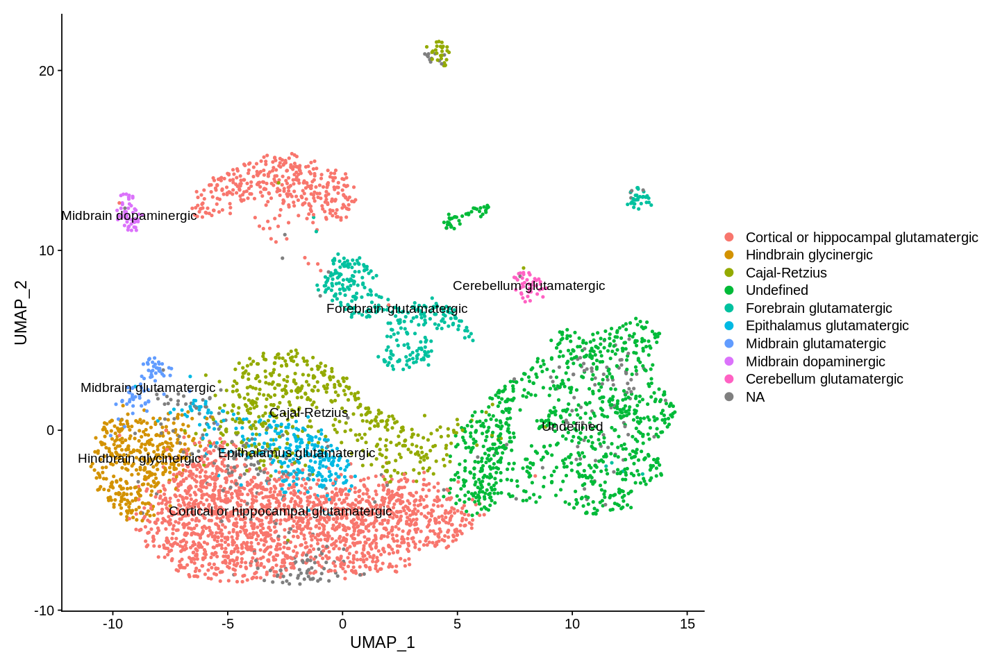

In [73]:
options(repr.plot.width=12, repr.plot.height=8)
DimPlot(nr5k, label = TRUE,pt.size = 0.8)

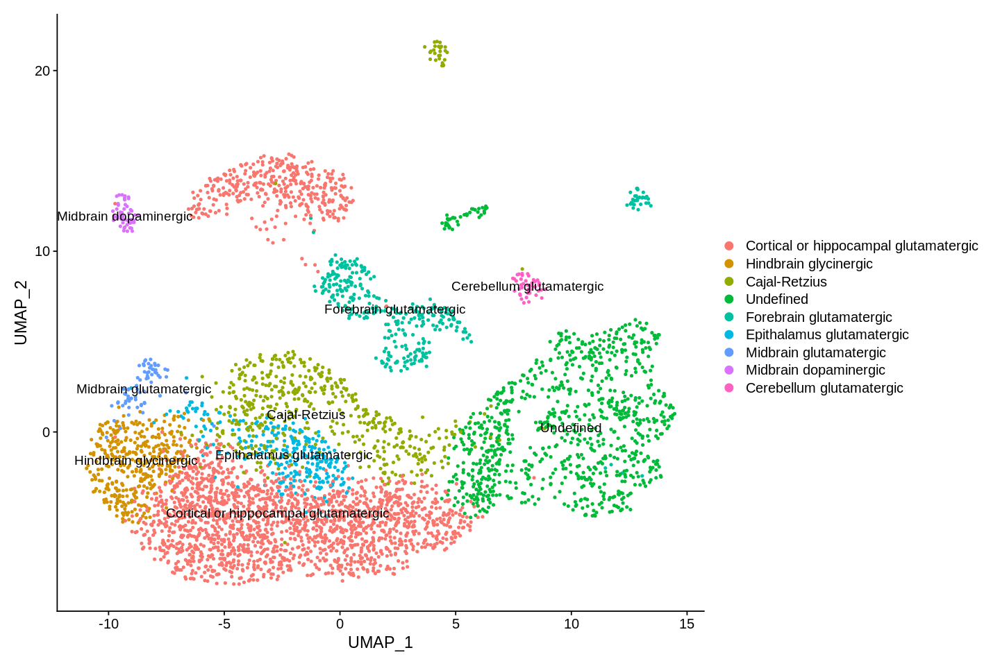

In [99]:
options(repr.plot.width=12, repr.plot.height=8)
nr5k@meta.data$cell_type<-nr5k@active.ident
nr5k<- subset(nr5k, subset = cell_type!='NA')
DimPlot(nr5k, label = TRUE,pt.size = 0.8)

Picking joint bandwidth of 0.0954

Picking joint bandwidth of 0.0788

Picking joint bandwidth of 0.126

Picking joint bandwidth of 3.28e-06

Picking joint bandwidth of 0.113

Picking joint bandwidth of 0.0869



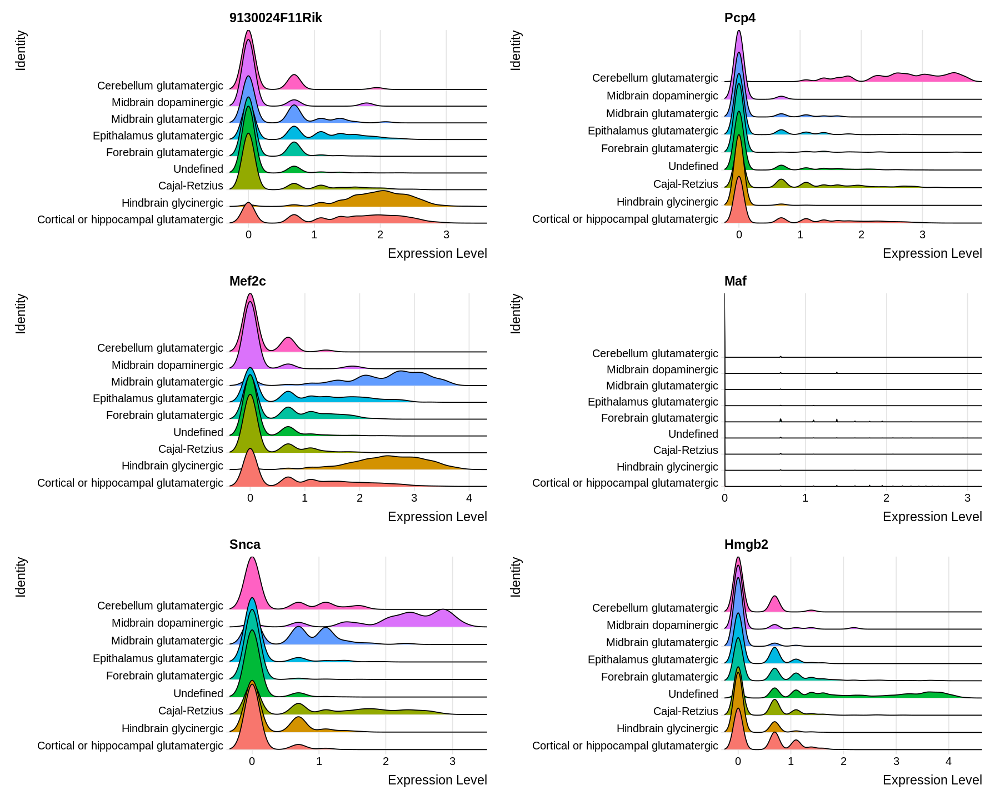

In [100]:
options(repr.plot.width=15, repr.plot.height=12)
RidgePlot(nr5k, features = genes[1:6], ncol = 2)

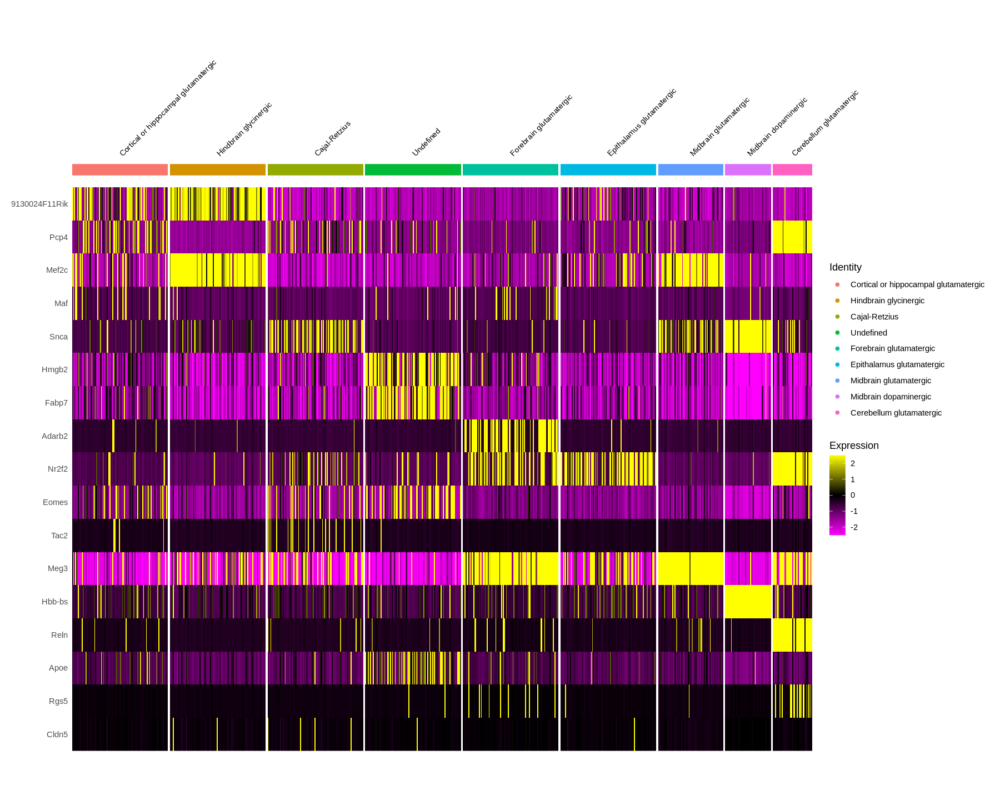

In [101]:
DoHeatmap(subset(nr5k, downsample = 100), features = genes, size = 3)

# Export the data

In [102]:
objfile<-"../data/objects/a2.neur5k.RData"
save(nr5k,ct,file=objfile)